# Data Exploration: Spanish Power Market + Solar & Wind Generation Profiles

This notebook explores the processed Spanish power market data including:
- Day-ahead spot prices (EUR/MWh)
- Generation profiles for Solar and Wind Onshore (scaled to one generation asset)
- Temporal patterns and distributions
- Correlations between price and generation

**Data Period**: 2015-2025  
**Granularity**: Hourly  
**Source**: ENTSO-E Transparency Platform  
**Market**: Spain (MIBEL)

## 1. Import Required Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import warnings
from pathlib import Path

# Visualisation settings
sns.set_style("whitegrid")
sns.set_palette("husl")
warnings.filterwarnings('ignore')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.precision', 2)

## 2. Load Processed Data

Load the hourly processed data for renewable technologies and prices.

In [2]:
# Define data directory
data_dir = Path('../data_processed')

# Load combined datasets
df_solar = pd.read_csv(data_dir / 'ES_combined_hourly_solar.csv', index_col=0, parse_dates=True)
df_wind_onshore = pd.read_csv(data_dir / 'ES_combined_hourly_wind_onshore.csv', index_col=0, parse_dates=True)

# Load standalone price data for reference
df_prices = pd.read_csv(data_dir / 'ES_prices_hourly.csv', index_col=0, parse_dates=True)

print(f"Solar data: {len(df_solar):,} hourly records from {df_solar.index.min()} to {df_solar.index.max()}")
print(f"Wind Onshore data: {len(df_wind_onshore):,} hourly records from {df_wind_onshore.index.min()} to {df_wind_onshore.index.max()}")
print(f"Price data: {len(df_prices):,} hourly records from {df_prices.index.min()} to {df_prices.index.max()}")

Solar data: 96,170 hourly records from 2015-01-01 00:00:00 to 2025-12-22 11:00:00
Wind Onshore data: 96,170 hourly records from 2015-01-01 00:00:00 to 2025-12-22 11:00:00
Price data: 96,205 hourly records from 2015-01-01 00:00:00 to 2025-12-22 23:00:00


## 3. Data Summary Statistics

In [3]:
print("="*80)
print("SOLAR GENERATION STATISTICS")
print("="*80)
print(df_solar.describe())

print("\n" + "="*80)
print("WIND ONSHORE GENERATION STATISTICS")
print("="*80)
print(df_wind_onshore.describe())

print("\n" + "="*80)
print("PRICE STATISTICS (All Data)")
print("="*80)
print(df_prices.describe())

SOLAR GENERATION STATISTICS
       price_eur_mwh  generation_mwh_solar
count       96170.00              96170.00
mean           70.52                 12.52
std            54.51                 15.03
min           -15.00                  0.00
25%            40.00                  0.41
50%            54.52                  4.13
75%            86.74                 24.05
max           700.00                 50.00

WIND ONSHORE GENERATION STATISTICS
       price_eur_mwh  generation_mwh_wind_onshore
count       96170.00                     96170.00
mean           70.52                        16.55
std            54.51                         9.70
min           -15.00                         0.00
25%            40.00                         8.86
50%            54.52                        14.72
75%            86.74                        22.58
max           700.00                        50.00

PRICE STATISTICS (All Data)
       price_eur_mwh
count       96205.00
mean           70.51
std    

## 4. Price Evolution Over Time (Interactive - Plotly)

In [4]:
fig = px.line(df_prices.reset_index(), 
              x='datetime', 
              y='price_eur_mwh',
              title='Spanish Day-Ahead Power Prices Over Time',
              labels={'datetime': 'Date', 'price_eur_mwh': 'Price (EUR/MWh)'},
              template='plotly_white')

fig.update_layout(
    height=500,
    hovermode='x unified',
    xaxis_title='Date',
    yaxis_title='Price (EUR/MWh)'
)

fig.show()

## 5. Generation Profiles Over Time (Interactive - Plotly)

In [5]:
# Create subplots for each technology
fig = make_subplots(
    rows=3, cols=1,
    subplot_titles=('Solar Generation', 'Wind Onshore Generation'),
    vertical_spacing=0.08
)

# Solar
fig.add_trace(
    go.Scatter(x=df_solar.index, y=df_solar['generation_mwh_solar'], 
               name='Solar', line=dict(color='#FDB813')),
    row=1, col=1
)

# Wind Onshore
fig.add_trace(
    go.Scatter(x=df_wind_onshore.index, y=df_wind_onshore['generation_mwh_wind_onshore'], 
               name='Wind Onshore', line=dict(color='#06A77D')),
    row=3, col=1
)

fig.update_layout(
    height=900,
    title_text="Renewable Generation Profiles (50 MW Capacity)",
    showlegend=False,
    template='plotly_white',
    hovermode='x unified'
)

fig.update_xaxes(title_text="Date", row=3, col=1)
fig.update_yaxes(title_text="Generation (MWh)", row=1, col=1)
fig.update_yaxes(title_text="Generation (MWh)", row=2, col=1)
fig.update_yaxes(title_text="Generation (MWh)", row=3, col=1)

fig.show()

## 6. Price Distribution Analysis (Seaborn)

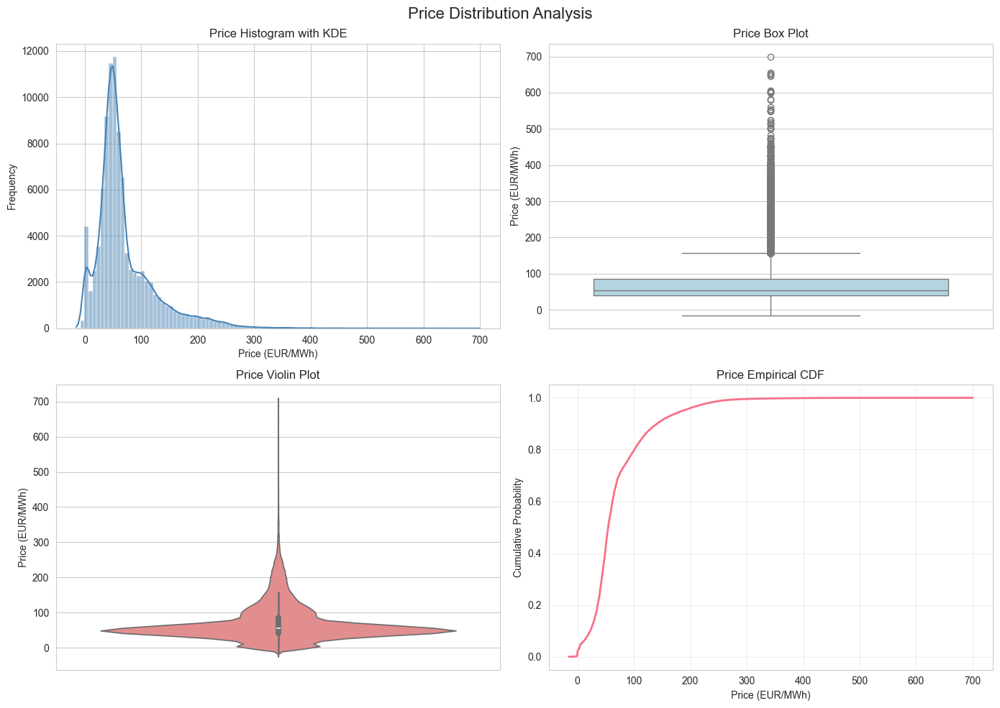


Price Statistics:
Mean: 70.51 EUR/MWh
Median: 54.52 EUR/MWh
Std Dev: 54.51 EUR/MWh
Min: -15.00 EUR/MWh
Max: 700.00 EUR/MWh
95th Percentile: 186.50 EUR/MWh
5th Percentile: 6.65 EUR/MWh


In [6]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Price Distribution Analysis', fontsize=16)

# Histogram with KDE
sns.histplot(df_prices['price_eur_mwh'], bins=100, kde=True, ax=axes[0, 0], color='steelblue')
axes[0, 0].set_title('Price Histogram with KDE')
axes[0, 0].set_xlabel('Price (EUR/MWh)')
axes[0, 0].set_ylabel('Frequency')

# Box plot
sns.boxplot(y=df_prices['price_eur_mwh'], ax=axes[0, 1], color='lightblue')
axes[0, 1].set_title('Price Box Plot')
axes[0, 1].set_ylabel('Price (EUR/MWh)')

# Violin plot
sns.violinplot(y=df_prices['price_eur_mwh'], ax=axes[1, 0], color='lightcoral')
axes[1, 0].set_title('Price Violin Plot')
axes[1, 0].set_ylabel('Price (EUR/MWh)')

# Empirical CDF
sorted_prices = np.sort(df_prices['price_eur_mwh'])
axes[1, 1].plot(sorted_prices, np.linspace(0, 1, len(sorted_prices)), linewidth=2)
axes[1, 1].set_title('Price Empirical CDF')
axes[1, 1].set_xlabel('Price (EUR/MWh)')
axes[1, 1].set_ylabel('Cumulative Probability')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print key statistics
print(f"\nPrice Statistics:")
print(f"Mean: {df_prices['price_eur_mwh'].mean():.2f} EUR/MWh")
print(f"Median: {df_prices['price_eur_mwh'].median():.2f} EUR/MWh")
print(f"Std Dev: {df_prices['price_eur_mwh'].std():.2f} EUR/MWh")
print(f"Min: {df_prices['price_eur_mwh'].min():.2f} EUR/MWh")
print(f"Max: {df_prices['price_eur_mwh'].max():.2f} EUR/MWh")
print(f"95th Percentile: {df_prices['price_eur_mwh'].quantile(0.95):.2f} EUR/MWh")
print(f"5th Percentile: {df_prices['price_eur_mwh'].quantile(0.05):.2f} EUR/MWh")

## 7. Generation Distribution Analysis (Seaborn)

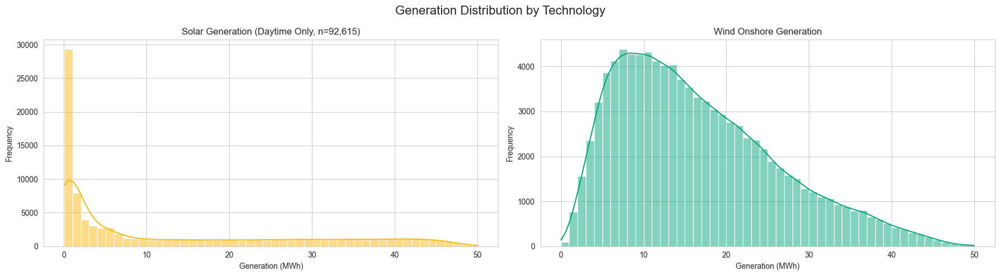


Capacity Factors (for 50 MW capacity):
Solar: 25.0%
Wind Onshore: 33.1%


In [7]:
fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Generation Distribution by Technology', fontsize=16)

# Solar (excluding zeros to show daytime distribution)
solar_nonzero = df_solar[df_solar['generation_mwh_solar'] > 0.05]['generation_mwh_solar']
sns.histplot(solar_nonzero, bins=50, kde=True, ax=axes[0], color='#FDB813')
axes[0].set_title(f'Solar Generation (Daytime Only, n={len(solar_nonzero):,})')
axes[0].set_xlabel('Generation (MWh)')
axes[0].set_ylabel('Frequency')

# Wind Onshore
sns.histplot(df_wind_onshore['generation_mwh_wind_onshore'], bins=50, kde=True, ax=axes[1], color='#06A77D')
axes[1].set_title('Wind Onshore Generation')
axes[1].set_xlabel('Generation (MWh)')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

# Capacity factors
print("\nCapacity Factors (for 50 MW capacity):")
print(f"Solar: {df_solar['generation_mwh_solar'].mean() / 50 * 100:.1f}%")
print(f"Wind Onshore: {df_wind_onshore['generation_mwh_wind_onshore'].mean() / 50 * 100:.1f}%")

## 8. Price vs Generation Scatter Plots (Seaborn)

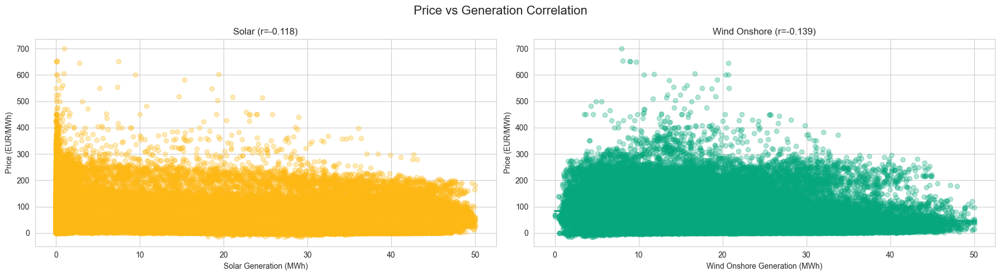

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Price vs Generation Correlation', fontsize=16)

# Solar
sns.regplot(x='generation_mwh_solar', y='price_eur_mwh', data=df_solar, 
            scatter_kws={'alpha':0.3}, ax=axes[0], color='#FDB813')
axes[0].set_title(f'Solar (r={df_solar[["generation_mwh_solar", "price_eur_mwh"]].corr().iloc[0,1]:.3f})')
axes[0].set_xlabel('Solar Generation (MWh)')
axes[0].set_ylabel('Price (EUR/MWh)')

# Wind Onshore
sns.regplot(x='generation_mwh_wind_onshore', y='price_eur_mwh', data=df_wind_onshore, 
            scatter_kws={'alpha':0.3}, ax=axes[1], color='#06A77D')
axes[1].set_title(f'Wind Onshore (r={df_wind_onshore[["generation_mwh_wind_onshore", "price_eur_mwh"]].corr().iloc[0,1]:.3f})')
axes[1].set_xlabel('Wind Onshore Generation (MWh)')
axes[1].set_ylabel('Price (EUR/MWh)')

plt.tight_layout()
plt.show()

## 9. Temporal Patterns - Hourly Profiles (Seaborn)

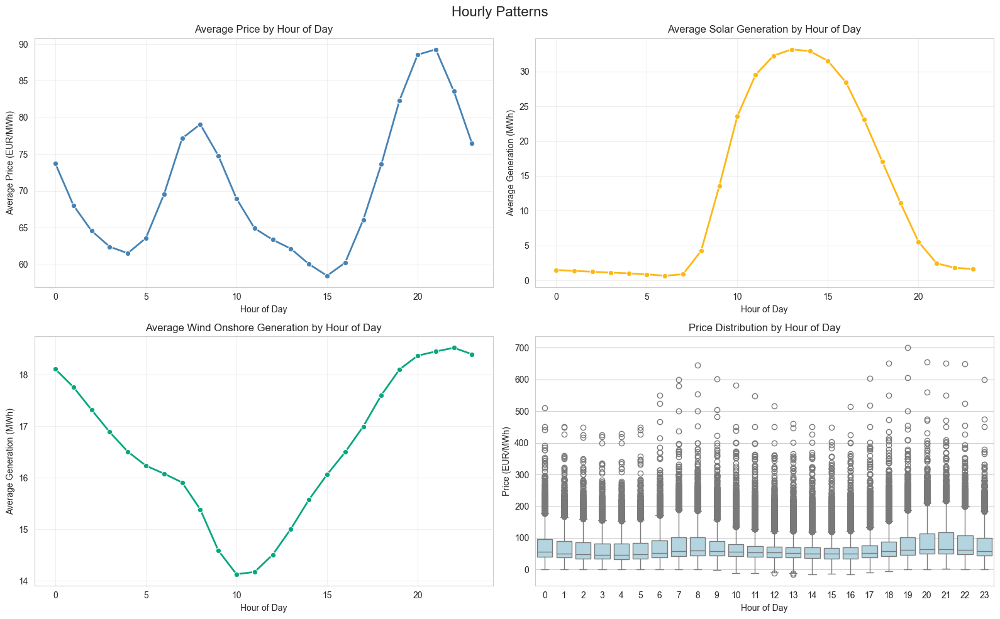

In [9]:
# Add hour of day to dataframes
df_solar_hourly = df_solar.copy()
df_solar_hourly['hour'] = df_solar_hourly.index.hour

df_wind_onshore_hourly = df_wind_onshore.copy()
df_wind_onshore_hourly['hour'] = df_wind_onshore_hourly.index.hour

df_prices_hourly = df_prices.copy()
df_prices_hourly['hour'] = df_prices_hourly.index.hour

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle('Hourly Patterns', fontsize=16)

# Average price by hour
hourly_price = df_prices_hourly.groupby('hour')['price_eur_mwh'].mean()
sns.lineplot(x=hourly_price.index, y=hourly_price.values, ax=axes[0, 0], marker='o', color='steelblue', linewidth=2)
axes[0, 0].set_title('Average Price by Hour of Day')
axes[0, 0].set_xlabel('Hour of Day')
axes[0, 0].set_ylabel('Average Price (EUR/MWh)')
axes[0, 0].grid(True, alpha=0.3)

# Average solar generation by hour
hourly_solar = df_solar_hourly.groupby('hour')['generation_mwh_solar'].mean()
sns.lineplot(x=hourly_solar.index, y=hourly_solar.values, ax=axes[0, 1], marker='o', color='#FDB813', linewidth=2)
axes[0, 1].set_title('Average Solar Generation by Hour of Day')
axes[0, 1].set_xlabel('Hour of Day')
axes[0, 1].set_ylabel('Average Generation (MWh)')
axes[0, 1].grid(True, alpha=0.3)

# Average wind onshore generation by hour
hourly_wind = df_wind_onshore_hourly.groupby('hour')['generation_mwh_wind_onshore'].mean()
sns.lineplot(x=hourly_wind.index, y=hourly_wind.values, ax=axes[1, 0], marker='o', color='#06A77D', linewidth=2)
axes[1, 0].set_title('Average Wind Onshore Generation by Hour of Day')
axes[1, 0].set_xlabel('Hour of Day')
axes[1, 0].set_ylabel('Average Generation (MWh)')
axes[1, 0].grid(True, alpha=0.3)

# Price boxplot by hour
sns.boxplot(data=df_prices_hourly, x='hour', y='price_eur_mwh', ax=axes[1, 1], color='lightblue')
axes[1, 1].set_title('Price Distribution by Hour of Day')
axes[1, 1].set_xlabel('Hour of Day')
axes[1, 1].set_ylabel('Price (EUR/MWh)')
axes[1, 1].tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.show()

## 10. Monthly Patterns (Seaborn)

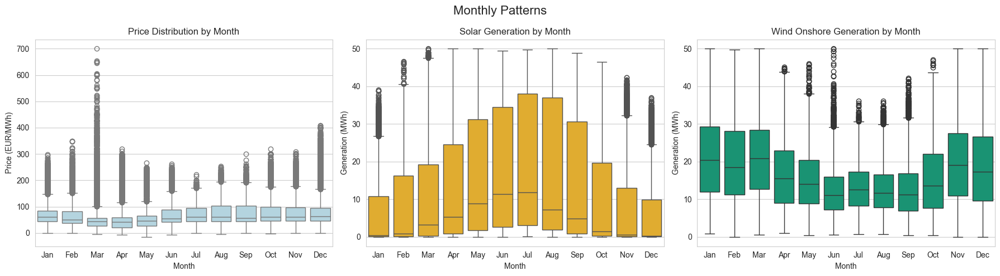

In [10]:
# Add month to dataframes
df_solar_monthly = df_solar.copy()
df_solar_monthly['month'] = df_solar_monthly.index.month

df_wind_onshore_monthly = df_wind_onshore.copy()
df_wind_onshore_monthly['month'] = df_wind_onshore_monthly.index.month

df_prices_monthly = df_prices.copy()
df_prices_monthly['month'] = df_prices_monthly.index.month

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Monthly Patterns', fontsize=16)

# Price by month
sns.boxplot(data=df_prices_monthly, x='month', y='price_eur_mwh', ax=axes[0], color='lightblue')
axes[0].set_title('Price Distribution by Month')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Price (EUR/MWh)')
axes[0].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Solar generation by month
sns.boxplot(data=df_solar_monthly, x='month', y='generation_mwh_solar', ax=axes[1], color='#FDB813')
axes[1].set_title('Solar Generation by Month')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Generation (MWh)')
axes[1].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Wind Onshore generation by month
sns.boxplot(data=df_wind_onshore_monthly, x='month', y='generation_mwh_wind_onshore', ax=axes[2], color='#06A77D')
axes[2].set_title('Wind Onshore Generation by Month')
axes[2].set_xlabel('Month')
axes[2].set_ylabel('Generation (MWh)')
axes[2].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.tight_layout()
plt.show()

## 11. Correlation Analysis

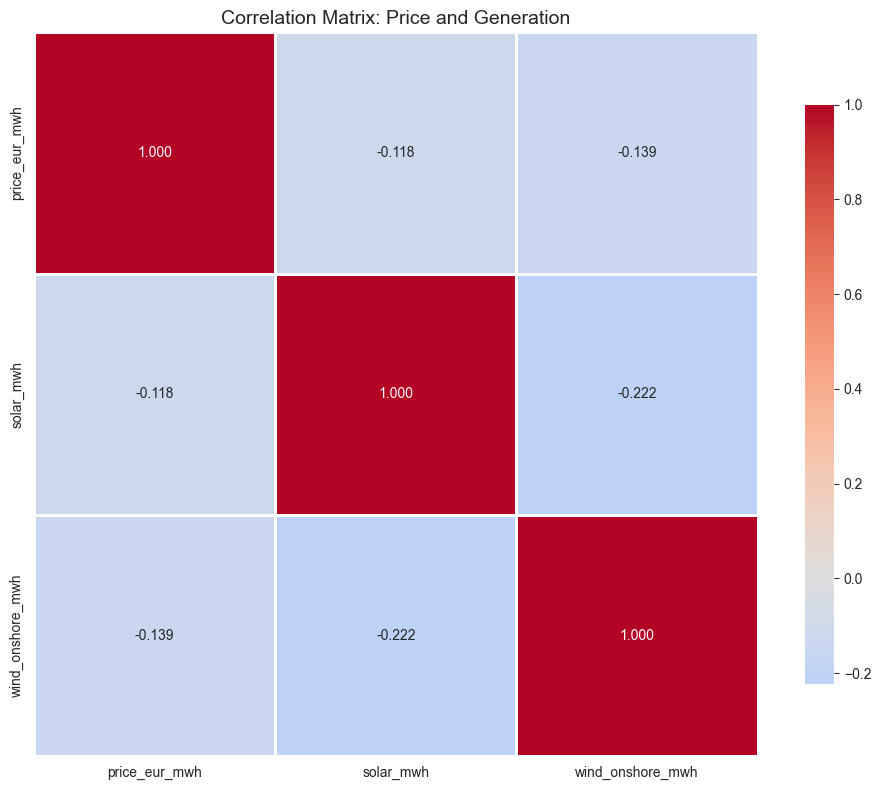


Key Correlations with Price:
Solar: -0.118
Wind Onshore: -0.139


In [11]:
# Merge all data for correlation analysis
df_all = df_prices.copy()
df_all['solar_mwh'] = df_solar['generation_mwh_solar']
df_all['wind_onshore_mwh'] = df_wind_onshore['generation_mwh_wind_onshore']

# Calculate correlation matrix
corr_matrix = df_all.corr()

# Plot correlation heatmap
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.3f', cmap='coolwarm', center=0, 
            square=True, linewidths=1, cbar_kws={"shrink": 0.8}, ax=ax)
ax.set_title('Correlation Matrix: Price and Generation', fontsize=14)
plt.tight_layout()
plt.show()

print("\nKey Correlations with Price:")
print(f"Solar: {corr_matrix.loc['price_eur_mwh', 'solar_mwh']:.3f}")
print(f"Wind Onshore: {corr_matrix.loc['price_eur_mwh', 'wind_onshore_mwh']:.3f}")

## 12. Interactive Price vs Generation (Plotly)

In [12]:
# Sample data for better performance (every 10th point)
df_sample = df_all[::10].copy()

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Price vs Solar', 'Price vs Wind Onshore'),
    horizontal_spacing=0.1
)

# Solar
fig.add_trace(
    go.Scatter(
        x=df_sample['solar_mwh'],
        y=df_sample['price_eur_mwh'],
        mode='markers',
        marker=dict(size=3, color='#FDB813', opacity=0.6),
        name='Solar',
        hovertemplate='Solar: %{x:.0f} MWh<br>Price: %{y:.2f} EUR/MWh<extra></extra>'
    ),
    row=1, col=1
)


# Wind Onshore
fig.add_trace(
    go.Scatter(
        x=df_sample['wind_onshore_mwh'],
        y=df_sample['price_eur_mwh'],
        mode='markers',
        marker=dict(size=3, color='#06A77D', opacity=0.6),
        name='Wind Onshore',
        hovertemplate='Wind Onshore: %{x:.0f} MWh<br>Price: %{y:.2f} EUR/MWh<extra></extra>'
    ),
    row=1, col=2
)

# Update layout
fig.update_xaxes(title_text="Generation (MWh)", row=1, col=1)
fig.update_xaxes(title_text="Generation (MWh)", row=1, col=2)
fig.update_yaxes(title_text="Price (EUR/MWh)", row=1, col=1)

fig.update_layout(
    title_text="Interactive Price vs Generation Analysis",
    showlegend=False,
    height=500,
    width=1400
)

fig.show()